In [2]:
import numpy as np
import os
import tensorflow as tf
import numpy              as np
import matplotlib.pyplot  as plt
import os
plt.rcParams.update({'font.size': 28})

In [4]:
# define path and load processed data
data_path = 'proc/'
model_path = 'model/'
name = 'X_train'

#every frequency is already resampled to the minimum sampling rate, i.e. 800MHz
X_train  = np.load(data_path + name +'.npy')[:, :2700, :]
camp = np.array(1/5375.313965)

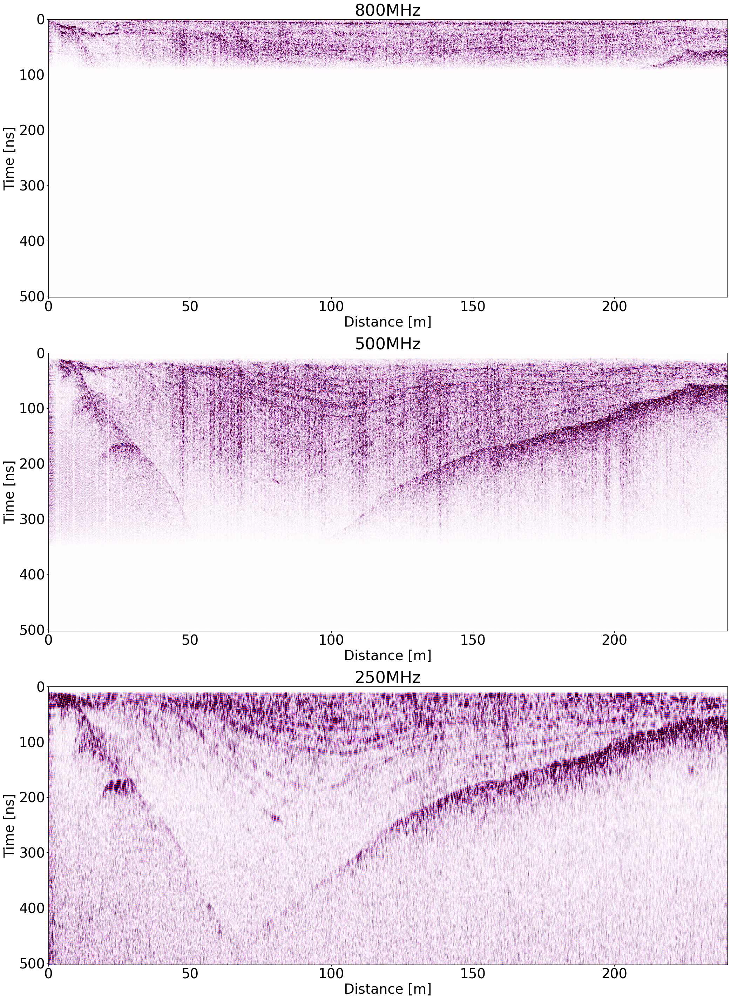

In [28]:
# plot of the input datas
plt.figure(figsize=[25, 35])
plt.subplot(311)
plt.title('800MHz')
plt.imshow(X_train[:, :, 0].T, cmap='seismic', aspect = 'auto', vmin = -0.1, vmax = 0.1, extent = [0, 240, X_train.shape[1]* camp*1000, 0])
plt.ylabel('Time [ns]')
plt.xlabel('Distance [m]')
plt.subplot(312)
plt.title('500MHz')
plt.ylabel('Time [ns]')
plt.xlabel('Distance [m]')
plt.imshow(X_train[:, :, 1].T, cmap='seismic', aspect = 'auto', vmin = -0.1, vmax = 0.1, extent = [0, 240, X_train.shape[1]* camp*1000, 0])
plt.subplot(313)
plt.ylabel('Time [ns]')
plt.xlabel('Distance [m]')
plt.title('250MHz')
plt.imshow(X_train[:, :, 2].T, cmap='seismic', aspect = 'auto', vmin = -0.1, vmax = 0.1, extent = [0, 240, X_train.shape[1]* camp*1000, 0])

In [29]:
# define custom loss 

def custom_loss_function(y_true, y_pred):
  squared_difference_1 = tf.square(y_true[:, :400, 0] - y_pred[:, :400, 0])
  squared_difference_2 = tf.square(y_true[:, :1000, 1] - y_pred[:, :1000, 0])
  squared_difference_3 = tf.square(y_true[:, :, 2] - y_pred[:, :, 0])
  return tf.reduce_mean(squared_difference_1, axis=-1) + tf.reduce_mean(squared_difference_2, axis=-1) + tf.reduce_mean(squared_difference_3, axis=-1)


# define Bi-Directional LSTM
inputs = tf.keras.Input(shape=(None, 3))
forward_layer = tf.keras.layers.LSTM(4, return_sequences=True)
backward_layer = tf.keras.layers.LSTM(4, return_sequences=True, go_backwards=True)
v = tf.keras.layers.Bidirectional(forward_layer, backward_layer=backward_layer)(inputs)

forward_layer = tf.keras.layers.LSTM(2, return_sequences=True)
backward_layer = tf.keras.layers.LSTM(2, return_sequences=True, go_backwards=True)
v = tf.keras.layers.Bidirectional(forward_layer, backward_layer=backward_layer)(v)

forward_layer = tf.keras.layers.LSTM(1, return_sequences=True)
backward_layer = tf.keras.layers.LSTM(1, return_sequences=True, go_backwards=True)
v = tf.keras.layers.Bidirectional(forward_layer, backward_layer=backward_layer)(v)

v = tf.keras.layers.LSTM(1, return_sequences= True)(v)
model = tf.keras.Model(inputs=[inputs], outputs=[v])

model.summary()

# Compile NN
model.compile(optimizer=tf.keras.optimizers.Adamax(learning_rate=0.01), loss = custom_loss_function)


Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, None, 3)]         0         
                                                                 
 bidirectional_6 (Bidirectio  (None, None, 8)          256       
 nal)                                                            
                                                                 
 bidirectional_7 (Bidirectio  (None, None, 4)          176       
 nal)                                                            
                                                                 
 bidirectional_8 (Bidirectio  (None, None, 2)          48        
 nal)                                                            
                                                                 
 lstm_20 (LSTM)              (None, None, 1)           16        
                                                           

In [15]:
# fit on half dataset
history = model.fit(X_train[::2, :, :], X_train[::2, :, :], epochs = 200, batch_size = 1024, verbose=1)

Epoch 1/200
2/2 [==============================] - 8s 895ms/step - loss: 0.0080
Epoch 2/200
2/2 [==============================] - 3s 1s/step - loss: 0.0080
Epoch 3/200
2/2 [==============================] - 3s 1s/step - loss: 0.0080
Epoch 4/200
2/2 [==============================] - 3s 1s/step - loss: 0.0080
Epoch 5/200
2/2 [==============================] - 3s 1s/step - loss: 0.0080
Epoch 6/200
2/2 [==============================] - 4s 2s/step - loss: 0.0079
Epoch 7/200
2/2 [==============================] - 3s 940ms/step - loss: 0.0080
Epoch 8/200
2/2 [==============================] - 3s 2s/step - loss: 0.0080
Epoch 9/200
2/2 [==============================] - 3s 2s/step - loss: 0.0079
Epoch 10/200
2/2 [==============================] - 3s 1s/step - loss: 0.0079
Epoch 11/200
2/2 [==============================] - 3s 1s/step - loss: 0.0079
Epoch 12/200
2/2 [==============================] - 3s 1s/step - loss: 0.0079
Epoch 13/200
2/2 [==============================] - 3s 961ms/step -

In [16]:
# predict whole dataset
y_pred = model.predict(X_train)

Text(0.5, 0, 'Distance [m]')

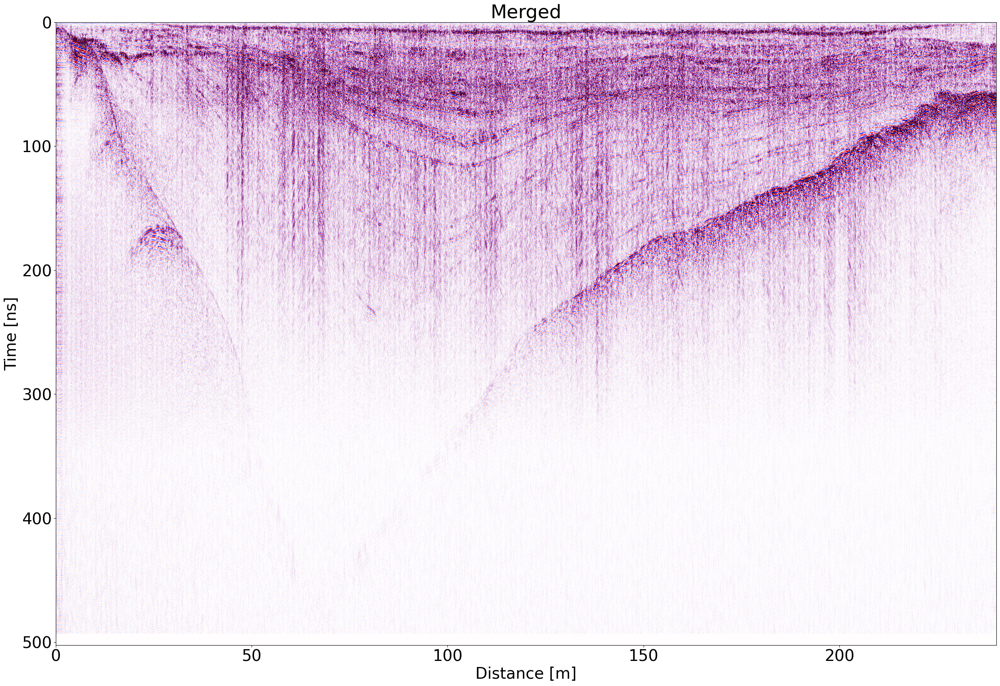

In [31]:
# plot prediction
plt.figure(figsize=[30, 20])
plt.title('Merged')
plt.imshow(y_pred[:, :, 0].T, cmap='seismic', aspect = 'auto', vmin = -0.1, vmax = 0.1, extent = [0, 240, y_pred.shape[1]* camp*1000, 0])
plt.ylabel('Time [ns]')
plt.xlabel('Distance [m]')